In [2]:
import tensorflow as tf
from tensorflow import keras
import cv2
import matplotlib.pyplot as plt
from skimage import io, draw
import numpy as np
import unit.img_process as imgp
import cv2

In [3]:
def show(title,image):
    ii=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)  
    io.imshow(ii)
    print(f"{title} : ")
    io.show()

In [4]:
model = keras.models.load_model("./models/deeplabv3_plus_res2netSE.h5")

In [5]:
face_cascade = cv2.CascadeClassifier("./models/haarcascade_frontalface_default.xml")   # 載入人臉模型

0/1084
frame : 


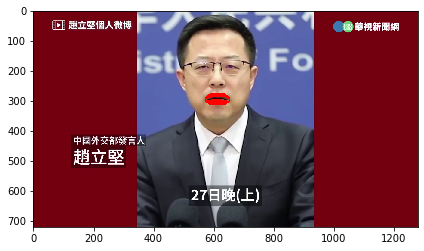

1/1084
frame : 


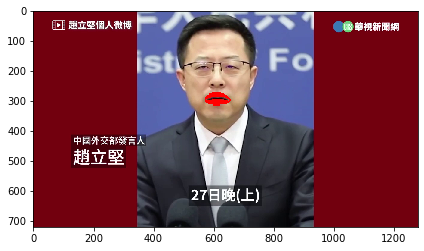

2/1084
frame : 


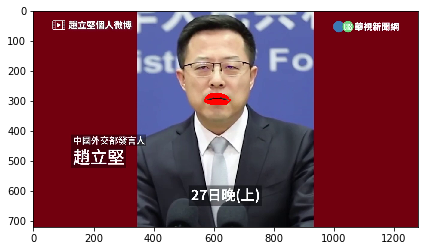

3/1084
frame : 


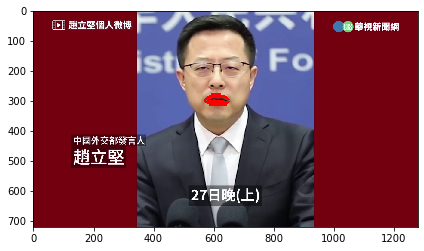

4/1084
frame : 


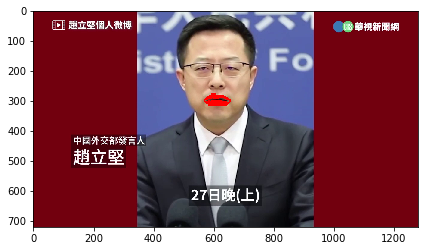

5/1084
frame : 


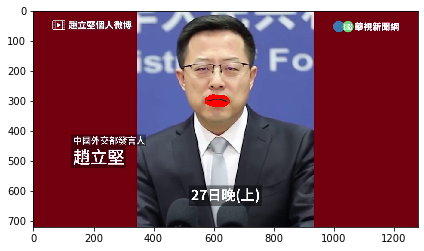

6/1084
frame : 


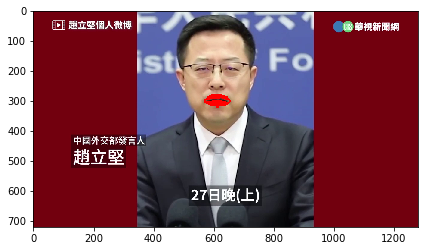

7/1084
frame : 


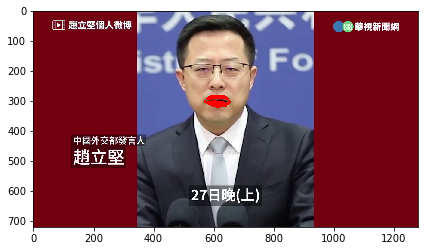

8/1084
frame : 


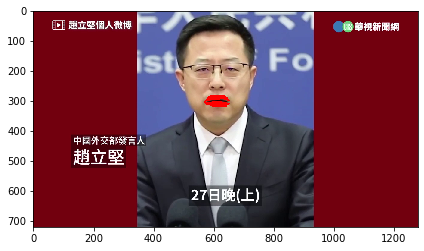

9/1084
frame : 


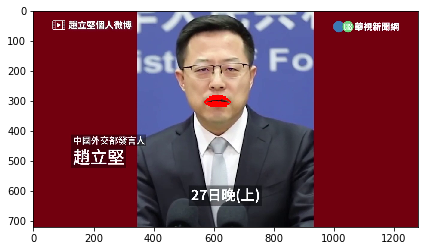

10/1084
frame : 


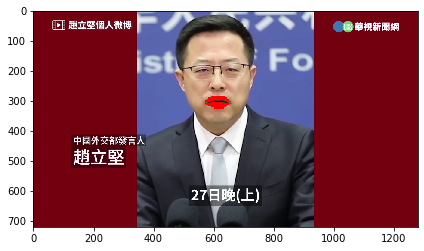

11/1084
frame : 


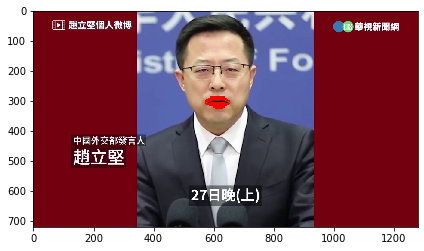

12/1084
frame : 


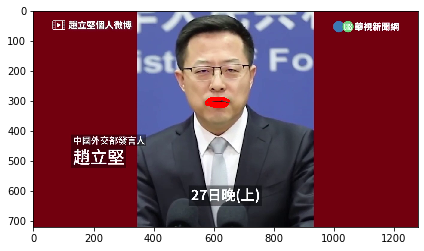

13/1084
frame : 


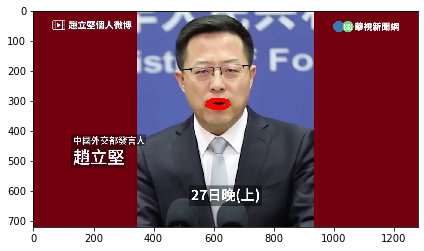

14/1084
frame : 


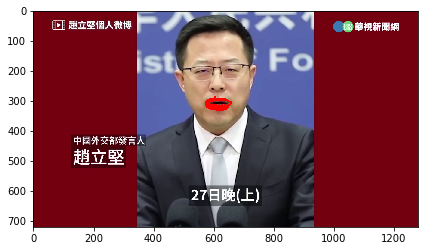

15/1084
frame : 


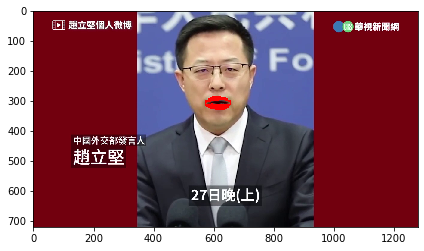

16/1084
frame : 


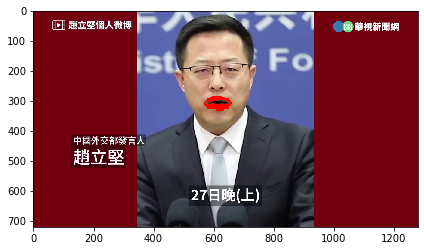

17/1084
frame : 


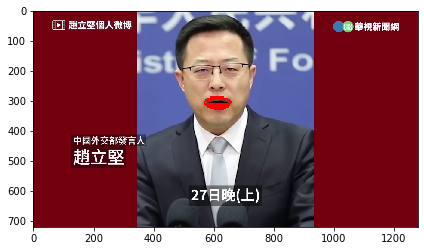

18/1084
frame : 


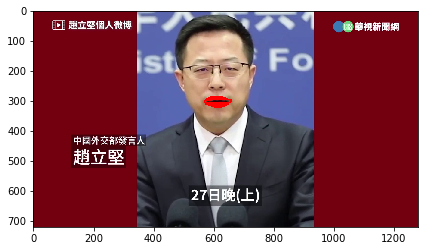

19/1084
frame : 


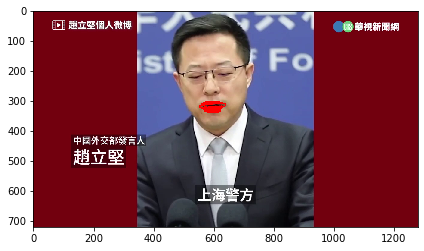

20/1084
frame : 


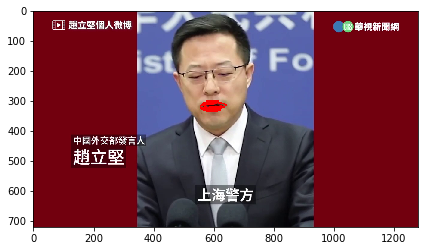

21/1084
frame : 


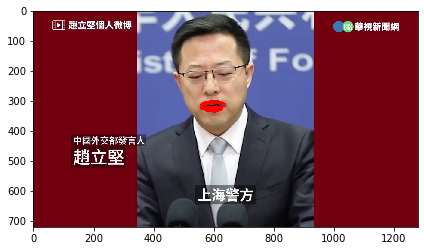

22/1084
frame : 


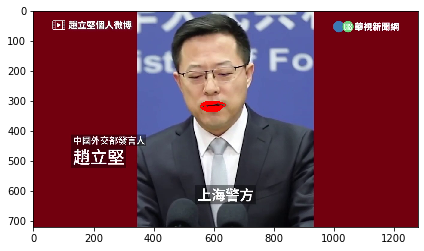

23/1084
frame : 


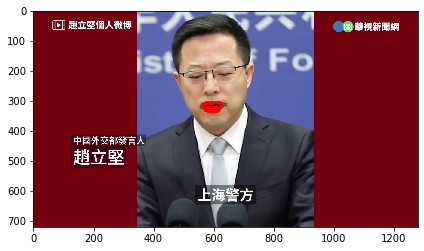

24/1084
frame : 


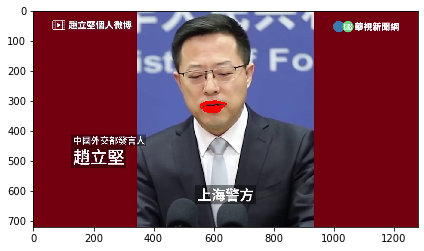

25/1084
frame : 


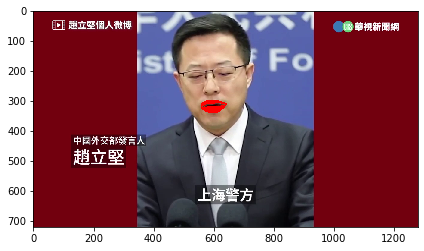

26/1084
frame : 


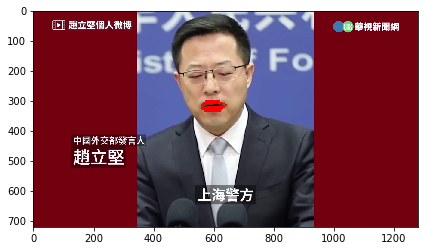

27/1084
frame : 


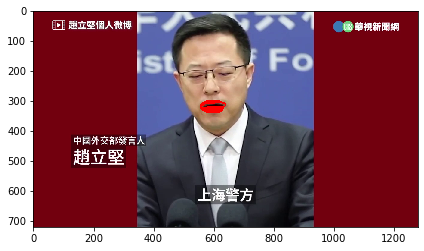

28/1084
frame : 


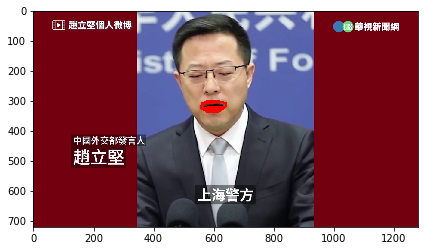

29/1084
frame : 


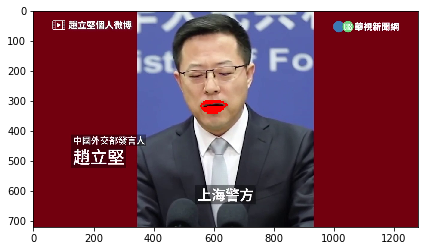

30/1084
frame : 


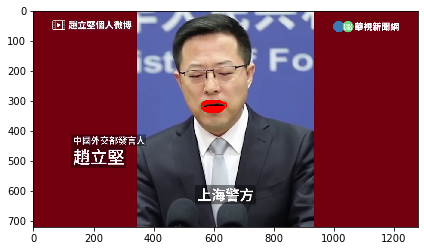

31/1084
frame : 


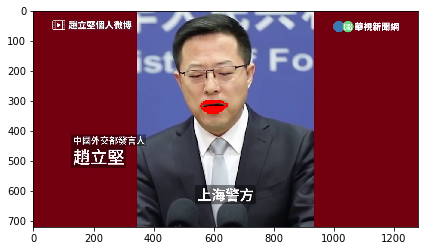

32/1084
frame : 


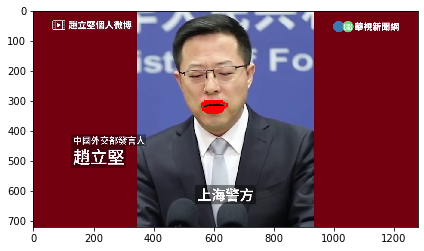

33/1084
frame : 


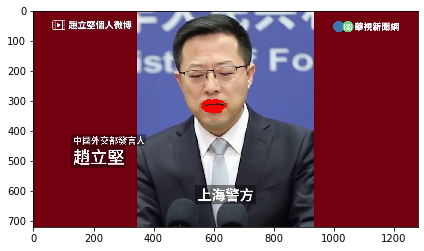

34/1084
frame : 


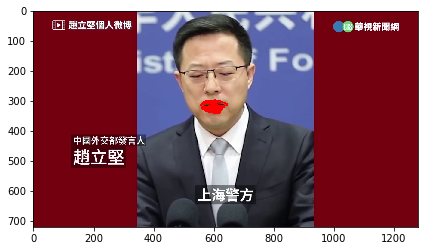

35/1084
frame : 


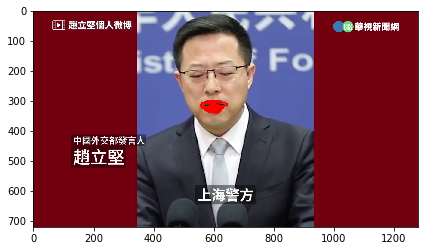

36/1084
frame : 


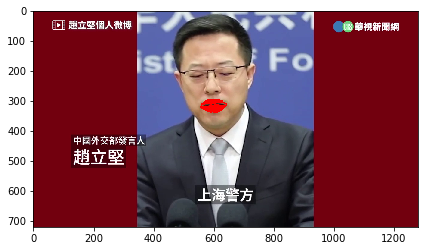

37/1084
frame : 


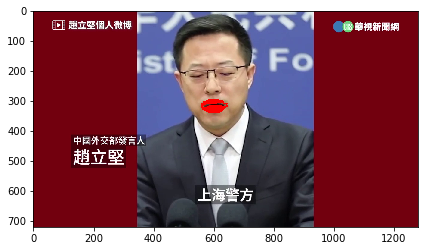

38/1084
frame : 


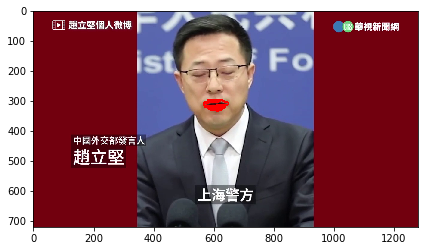

39/1084
frame : 


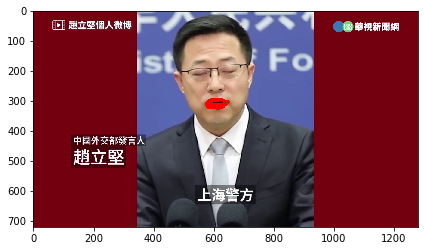

40/1084
frame : 


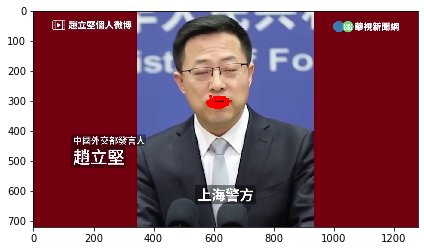

41/1084
frame : 


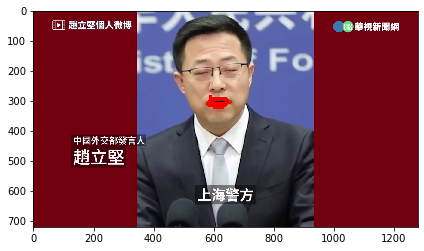

42/1084
frame : 


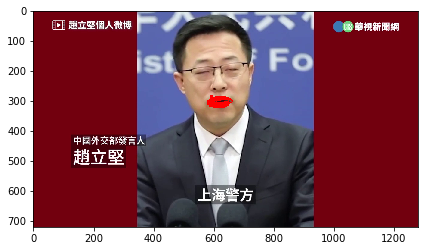

43/1084
frame : 


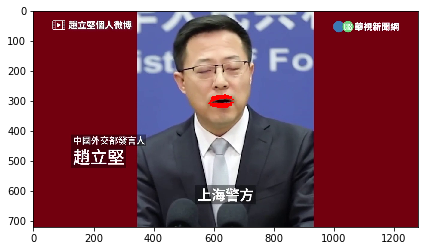

44/1084
frame : 


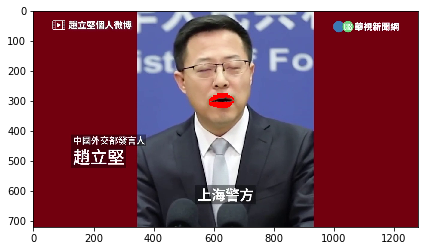

45/1084
frame : 


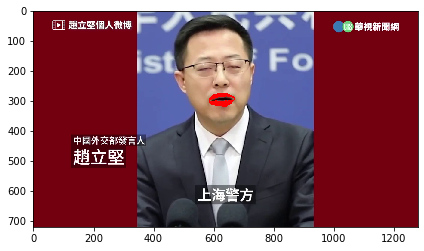

46/1084
frame : 


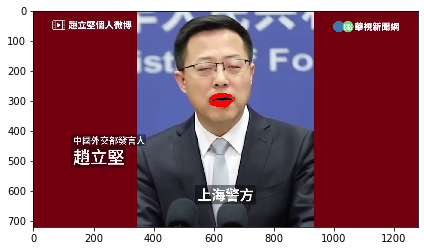

47/1084
frame : 


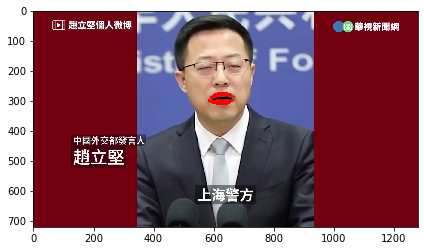

48/1084
frame : 


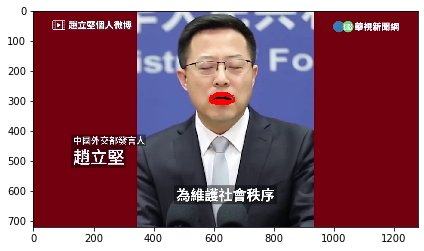

49/1084
frame : 


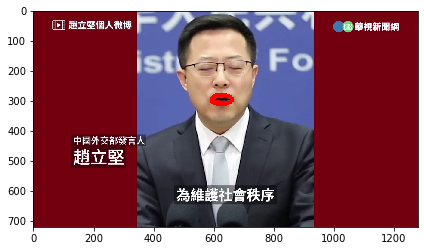

50/1084
frame : 


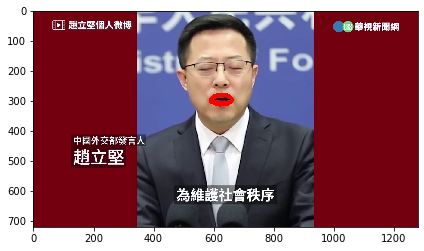

51/1084
frame : 


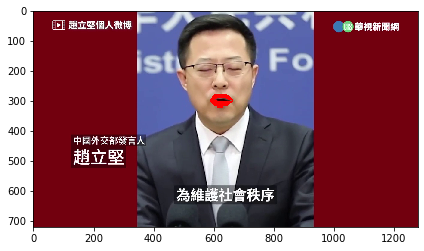

52/1084
frame : 


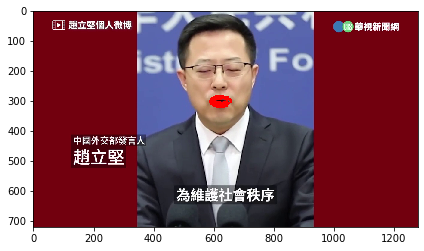

53/1084
frame : 


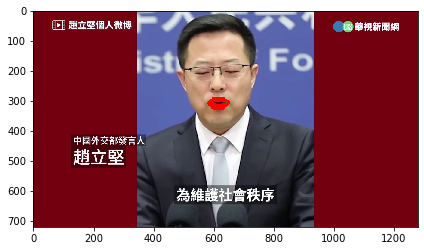

54/1084
frame : 


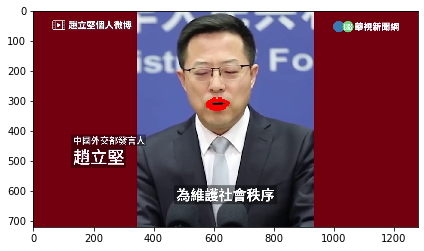

55/1084
frame : 


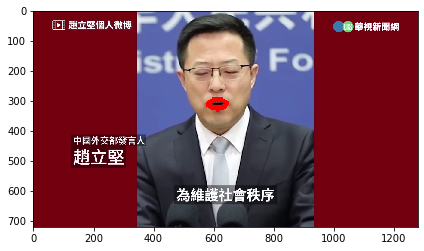

56/1084
frame : 


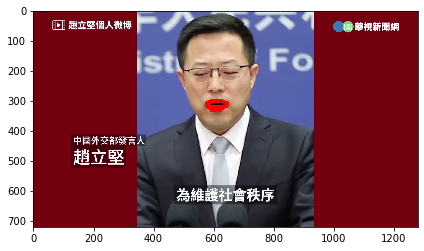

57/1084
frame : 


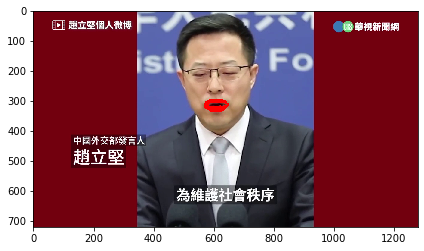

58/1084
frame : 


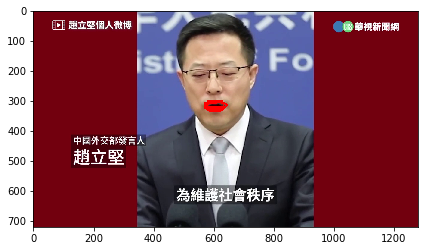

59/1084
frame : 


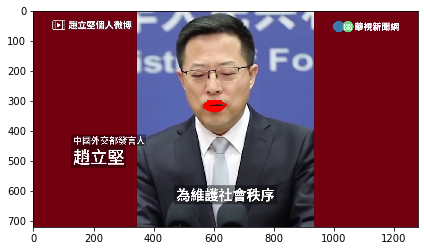

60/1084
frame : 


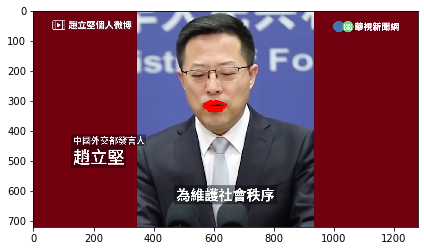

61/1084
frame : 


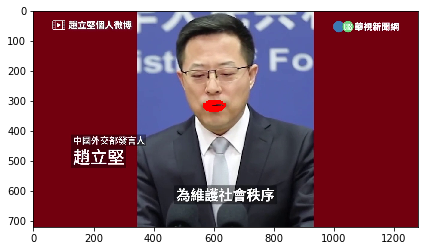

62/1084
frame : 


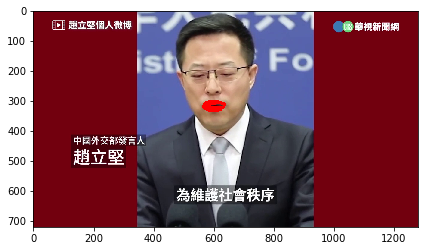

63/1084
frame : 


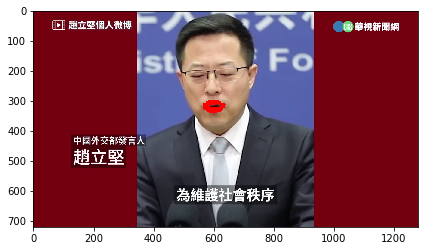

64/1084
frame : 


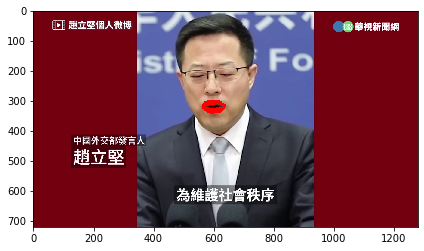

65/1084
frame : 


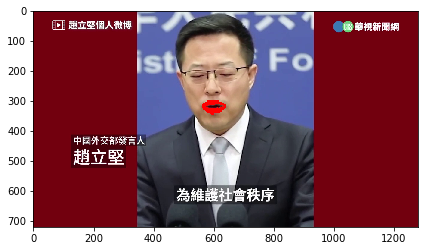

66/1084
frame : 


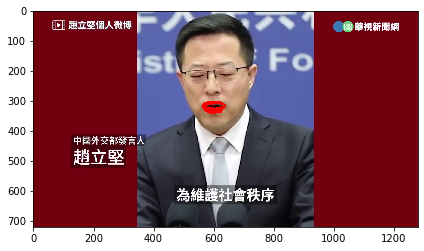

67/1084
frame : 


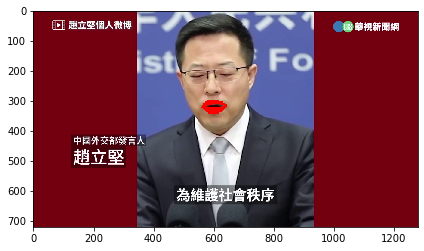

68/1084
frame : 


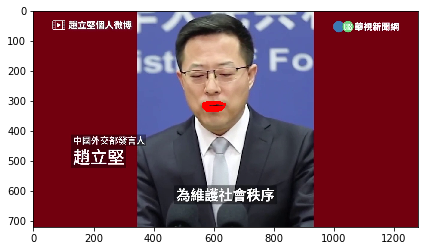

69/1084
frame : 


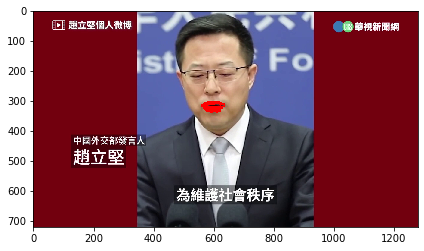

70/1084
frame : 


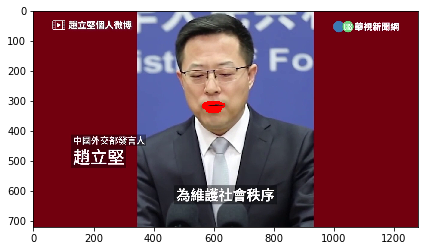

71/1084
frame : 


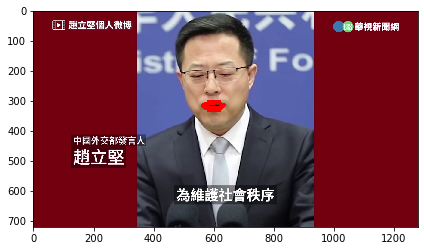

72/1084
frame : 


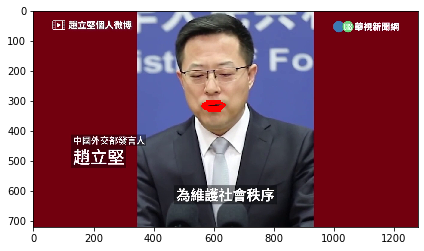

73/1084
frame : 


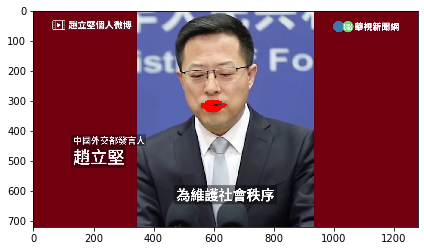

74/1084
frame : 


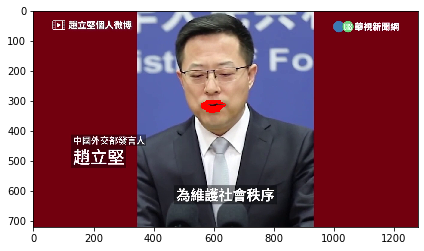

75/1084
frame : 


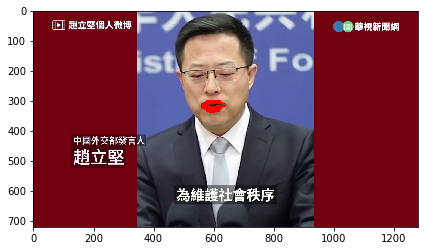

76/1084
frame : 


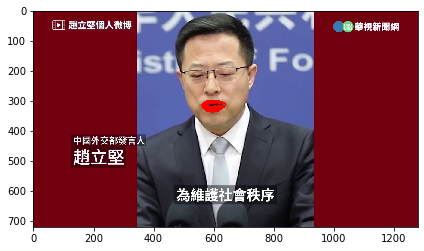

77/1084
frame : 


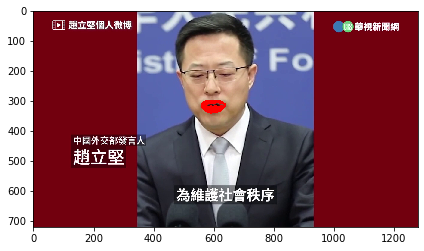

78/1084
frame : 


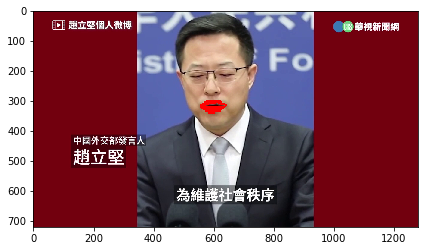

79/1084
frame : 


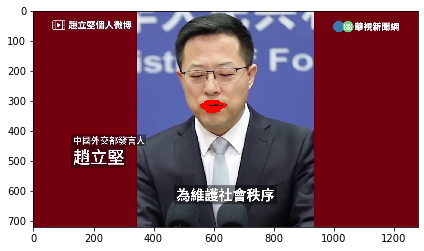

80/1084
frame : 


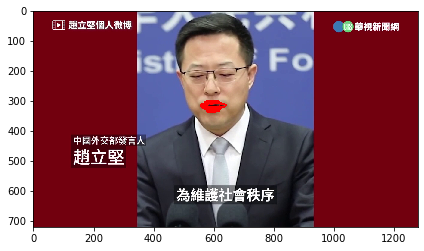

81/1084
frame : 


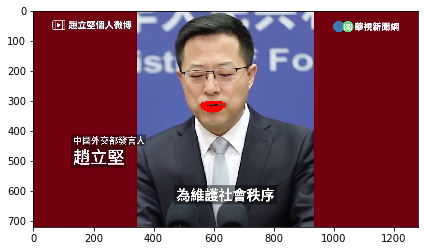

82/1084
frame : 


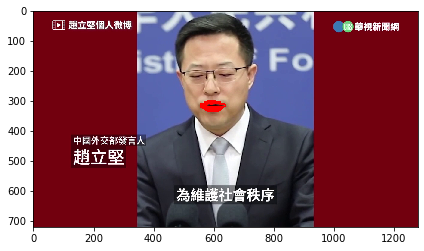

83/1084
frame : 


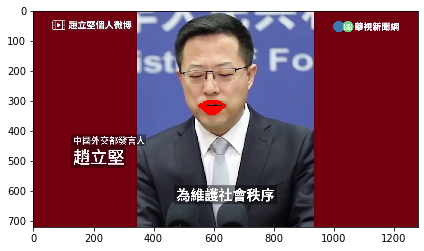

84/1084
frame : 


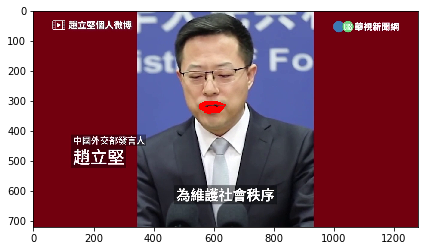

85/1084
frame : 


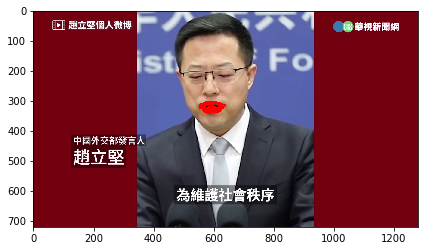

86/1084
frame : 


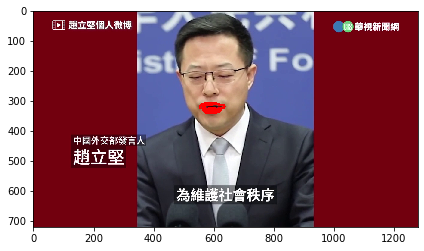

87/1084
frame : 


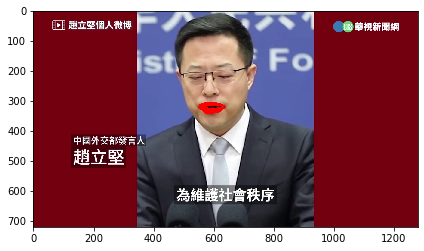

88/1084
frame : 


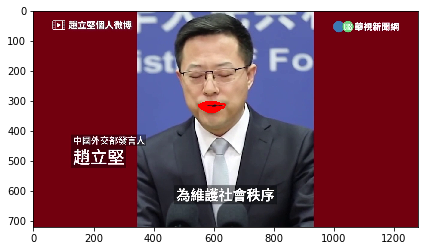

89/1084
frame : 


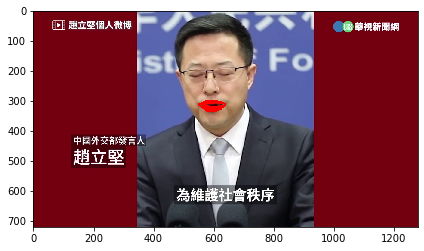

90/1084
frame : 


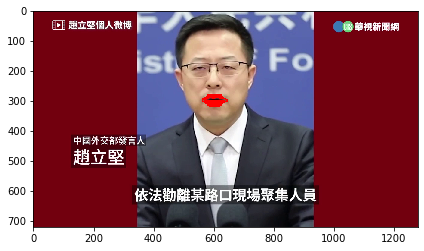

91/1084
frame : 


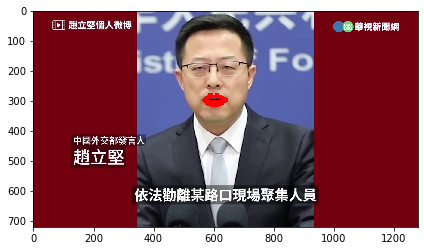

92/1084
frame : 


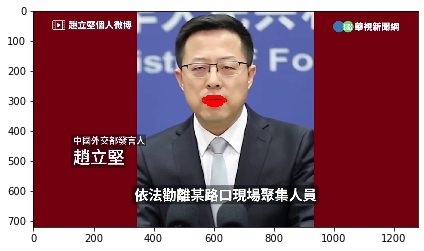

93/1084
frame : 


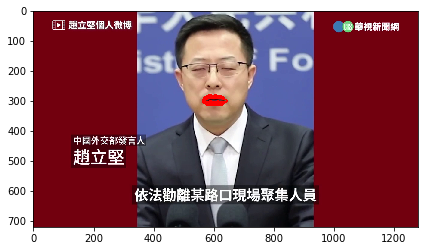

94/1084
frame : 


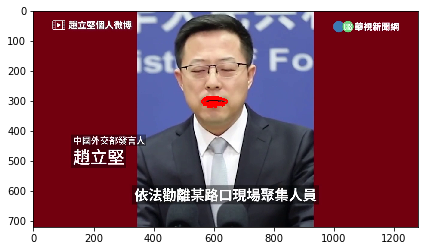

95/1084
frame : 


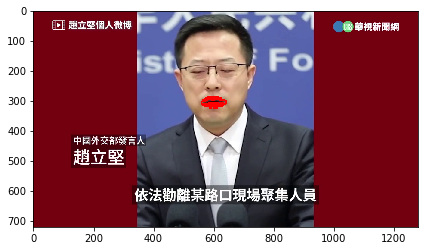

96/1084
frame : 


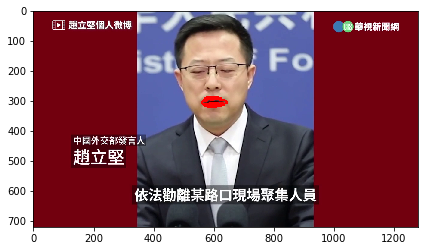

97/1084
frame : 


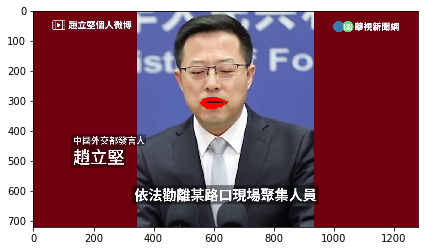

98/1084
frame : 


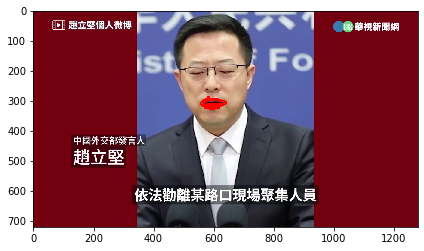

99/1084
frame : 


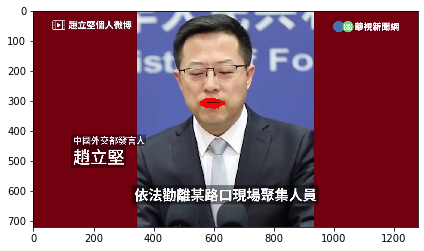

100/1084
frame : 


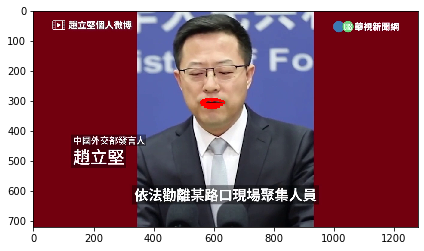

In [6]:
inp_video_path = './video_inp/555.mp4'
cap = cv2.VideoCapture(inp_video_path) # 讀取電腦中的影片
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

if not cap.isOpened():
    print("Cannot open camera")
    exit()
ret, frame = cap.read() 
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('./video_out/555_out.mp4', fourcc, 30.0, (frame.shape[1],  frame.shape[0]))
f = 0
while True:
    ret, frame = cap.read()             
    if not ret:
        print("Cannot receive frame")  
        break
        
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)  
   
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=9)    # 偵測人臉
    face_img = []
    c_img = frame.copy()
    for (x, y, w, h) in faces:
        
        cv2.rectangle(c_img, (x, y), (x+w, y+h), (0, 255, 0), 2)    # 利用 for 迴圈，抓取每個人臉屬性，繪製方框
        crop_range = [max(0,y-50),min(y+h+50,c_img.shape[0]), max(x-50,0),min(x+w+50,c_img.shape[1])]
        temp = frame[crop_range[0]:crop_range[1], crop_range[2]:crop_range[3],:] #將原始人臉方框增大範圍
        
        face_img.append([crop_range,temp])
        
    for img_range,crop_img in face_img:
        
        mask_img = imgp.get_maskimg(model,crop_img,(512,512),debug=False)

        x1_img = crop_img.copy()
        #show('sss',mask_img['mount'])
        temp1 = mask_img['mount'][:,:,2].copy()
        temp1[temp1>100]=255
        temp1[temp1<=100]=0
        mask_img['mount'][:,:,-1]=temp1
        
        mask_img['mount'][:,:,1]=0
        mask_img['mount'][:,:,0]=0
        #show('aa',mask_img['mount'])
        
        red = mask_img['mount'][:,:,2]
        
        x1_img[:,:,2][red!=0]=red[red!=0]
        x1_img[:,:,1][red!=0]=0
        x1_img[:,:,0][red!=0]=0
        frame[img_range[0]:img_range[1], img_range[2]:img_range[3]] = x1_img
    print(f'{f}/{frame_count}')
    f+=1
    show('frame', frame)  #顯示處理完的影像
    out.write(frame)      #寫入影片
    if cv2.waitKey(1) == ord('q'):     
        break

        
out.release()
cap.release()                           
cv2.destroyAllWindows() 